# EDA
Nhóm thực hiện quá trình EDA cho bộ dữ liệu [Zalo AI Challenge Traffic Sign Detection](https://dl.challenge.zalo.ai/traffic-sign-detection/data/za_traffic_2020.zip). 
Bộ dữ liệu được cào trên Google Street View Map, được làm sạch và gán nhãn thành 7 lớp:  
1: No entry (Cấm đi ngược chiều)  
2: No parking / waiting (Cấm dừng, đỗ)    
3: No turning (Cấm rẽ)  
4: Max Speed (Tốc độ tối đa)  
5: Other prohibition signs (Các biển cấm khác)  
6: Warning (Biển cảnh báo)  
7: Mandatory (Biển hiệu lệnh)  

Tất cả các ảnh đều có cùng kích thước 1622x626

In [1]:
import json
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# 1. Split training and validating set

In [2]:
def convert_json_to_df_for_tfrecord(data, class_dict):
  images = data['images']
  annotations = data['annotations']
  categories = data['categories']

  df = pd.DataFrame()
  filename = []
  class_text = []
  xmin = []
  ymin = []
  xmax = []
  ymax = []
  width = []
  height = []

  for an in annotations:
    # filename
    image_id = an['image_id']
    imageFile = str(image_id) + '.png'
    filename.append(imageFile)

    # xmin
    xmin.append(an['bbox'][0])

    # ymin
    ymin.append(an['bbox'][1])

    # xmax
    xmax.append(an['bbox'][0] + an['bbox'][2])

    # ymax
    ymax.append(an['bbox'][1] + an['bbox'][3])

    # width
    width.append(1622)

    # height
    height.append(626)

    # class
    classId = an['category_id']
    class_text.append(class_dict[classId])

  df['filename'] = filename
  df['width'] = width
  df['height'] = height
  df['class'] = class_text
  df['xmin'] = xmin
  df['ymin'] = ymin
  df['xmax'] = xmax
  df['ymax'] = ymax
  return df 

In [3]:
def convert_json_to_df(data):
  images = data['images']
  annotations = data['annotations']
  categories = data['categories']

  print('Số lượng ảnh trong tập dữ liệu là', len(images))
  df = pd.DataFrame()
  image_id = []
  category_id = []
  area = []
  x = []
  y = []
  w = []
  h = []
  for an in annotations:
    image_id.append(an['image_id'])
    category_id.append(an['category_id'])
    area.append(an['area'])
    x.append(an['bbox'][0])
    y.append(an['bbox'][1])
    w.append(an['bbox'][2])
    h.append(an['bbox'][3])
  df['image_id'] = image_id
  df['category_id'] = category_id
  df['area'] = area
  df['x'] = x
  df['y'] = y
  df['w'] = w
  df['h'] = h 

  return df

In [4]:
filepath = '/content/drive/MyDrive/DL_Project/Data/Meta/train_traffic_sign_dataset.json'
with open(filepath, 'r') as fp:
  data = json.load(fp)
df = convert_json_to_df(data)

Số lượng ảnh trong tập dữ liệu là 4500


In [5]:
class_dict = {
    1: 'cam_nguoc_chieu',
    2: 'cam_dung_va_do',
    3: 'cam_re',
    4: 'gioi_han_toc_do',
    5: 'cam_con_lai',
    6: 'nguy_hiem',
    7: 'hieu_lenh'
}

In [6]:
validate_id = pd.read_csv('/content/drive/MyDrive/DL_Project/Data_Split/validate_image_id.txt', header=None)
validate_id = validate_id[0].to_list()
validate_id = [x.strip() for x in validate_id]

In [8]:
df_tfrecord = convert_json_to_df_for_tfrecord(data, class_dict)
df_tfrecord.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,3.png,1622,626,cam_dung_va_do,880,333,899,351
1,5.png,1622,626,cam_re,1069,355,1152,438
2,5.png,1622,626,cam_dung_va_do,768,480,777,487
3,6.png,1622,626,nguy_hiem,781,337,798,352
4,16.png,1622,626,cam_dung_va_do,733,352,740,360


In [9]:
df_validate = df_tfrecord[df_tfrecord['filename'].isin(validate_id)]
df_validate.to_csv('/content/drive/MyDrive/DL_Project/Data/validate.csv', index=False)

In [10]:
df_train = df_tfrecord[~df_tfrecord['filename'].isin(validate_id)]
df_train.to_csv('/content/drive/MyDrive/DL_Project/Data/train.csv', index=False)

# 2. EDA cho bộ dữ liệu nguyên thủy

In [11]:
import matplotlib.patches as patches
def get_all_bboxes(df, image_id):
    image_bboxes = df[df.image_id == image_id]
    
    bboxes = []
    for _,row in image_bboxes.iterrows():
        bboxes.append((row.x, row.y, row.w, row.h))
        
    return bboxes

def plot_image_examples(df, path, rows=3, cols=3, title='Image examples'):
    if rows == 1 and cols == 1:
      fig, axs = plt.subplots(rows, cols, figsize=(16,8))
      img_id = np.unique(df['image_id'])[0]
      img = cv2.imread(os.path.join(path, str(img_id) + '.png'))
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      axs.imshow(img)
            
      bboxes = get_all_bboxes(df, img_id)
      for bbox in bboxes:
          cv2.rectangle(img,
                    (bbox[0], bbox[1]),
                    (bbox[0] + bbox[2],  bbox[1] + bbox[3]),
                    (220, 0, 0), 3)
      axs.axis('off')
    else:
      fig, axs = plt.subplots(rows, cols, figsize=(10,10))
      for row in range(rows):
          for col in range(cols):
              idx = np.random.randint(len(df), size=1)[0]
              img_id = df.iloc[idx].image_id
            
              img = cv2.imread(os.path.join(path, str(img_id) + '.png'))
              img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
              axs[row, col].imshow(img)
            
              bboxes = get_all_bboxes(df, img_id)
            
              for bbox in bboxes:
                rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
                axs[row, col].add_patch(rect)
              axs[row, col].axis('off')
           
    plt.suptitle(title)
    plt.show()

In [12]:
df.sort_values('image_id')
df

,image_id,category_id,area,x,y,w,h
0,3,2,342,880,333,19,18
1,5,3,6889,1069,355,83,83
2,5,2,63,768,480,9,7
3,6,6,255,781,337,17,15
4,16,2,56,733,352,7,8
...,...,...,...,...,...,...,...
10995,12519,7,27300,902,290,273,100
10996,12521,2,1968,1338,173,48,41
10997,12523,2,420,800,256,20,21
10998,12523,6,336,800,281,21,16


In [13]:
print('Số lượng bbox có trong 4500 ảnh là', len(df))
print('Vậy TB mỗi ảnh có', len(df)/4500)

Số lượng bbox có trong 4500 ảnh là 11000
Vậy TB mỗi ảnh có 2.4444444444444446


In [14]:
data['categories']

[{'id': 1, 'name': 'Cấm ngược chiều', 'supercategory': 'Cấm ngược chiều'},
 {'id': 2, 'name': 'Cấm dừng và đỗ', 'supercategory': 'Cấm dừng và đỗ'},
 {'id': 3, 'name': 'Cấm rẽ', 'supercategory': 'Cấm rẽ'},
 {'id': 4, 'name': 'Giới hạn tốc độ', 'supercategory': 'Giới hạn tốc độ'},
 {'id': 5, 'name': 'Cấm còn lại', 'supercategory': 'Cấm còn lại'},
 {'id': 6, 'name': 'Nguy hiểm', 'supercategory': 'Nguy hiểm'},
 {'id': 7, 'name': 'Hiệu lệnh', 'supercategory': 'Hiệu lệnh'}]

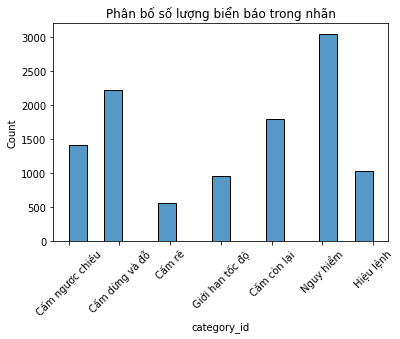

In [15]:
sns.histplot(df['category_id'])
plt.title('Phân bố số lượng biển báo trong nhãn')
plt.xticks([1,2,3,4,5,6,7], [d['name'] for d in data['categories']], rotation=45)
plt.show()

In [16]:
df_cat = df.groupby('category_id').size().reset_index(name='count')
df_cat.head()

,category_id,count
0,1,1416
1,2,2221
2,3,556
3,4,949
4,5,1787


In [17]:
np.max(df_cat['count'])

3049

In [18]:
np.min(df_cat['count'])

556

In [19]:
df_count = df.groupby('image_id').size().reset_index(name='count')

In [20]:
df_count.head()

,image_id,count
0,3,1
1,5,2
2,6,1
3,16,1
4,17,1


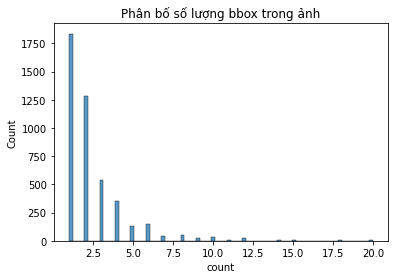

In [21]:
sns.histplot(df_count['count'])
plt.title('Phân bố số lượng bbox trong ảnh')
plt.show()

In [22]:
print('Hầu hết các ảnh có từ 1-2 bbox')
maxId = df_count['count'].idxmax()
print('Ảnh với số lượng nhiều bbox nhất là ảnh với ID', df_count['image_id'][maxId], 'với', df_count['count'][maxId], 'bbox')

Hầu hết các ảnh có từ 1-2 bbox
Ảnh với số lượng nhiều bbox nhất là ảnh với ID 8916 với 20 bbox


In [23]:
df_max_box = df[df['image_id'] == 8916]
df_max_box.head()

,image_id,category_id,area,x,y,w,h
6805,8916,2,81,983,314,9,9
6806,8916,4,240,809,231,15,16
6807,8916,4,169,828,231,13,13
6808,8916,2,256,844,230,16,16
6809,8916,5,156,846,248,12,13


In [24]:
len(df_max_box)

20

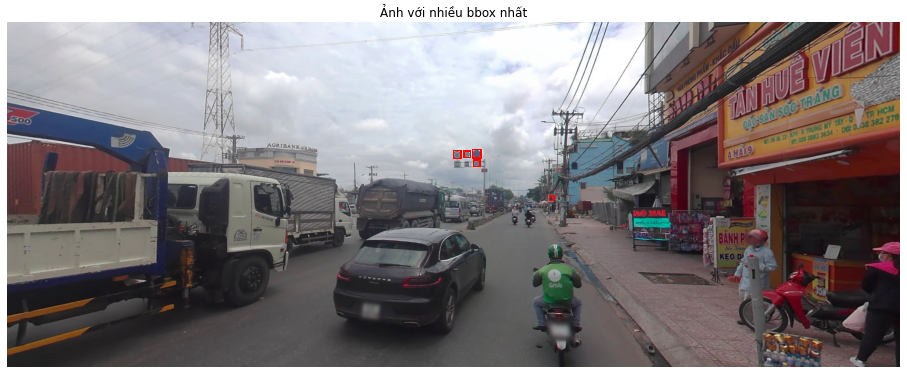

In [25]:
train_path = '/content/drive/MyDrive/DL_Project/Data/Train_Set'
fig, axs = plt.subplots(1,1, figsize=(16,8))
img_id = np.unique(df_max_box['image_id'])[0]
img = cv2.imread(os.path.join(train_path, str(img_id) + '.png'))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
axs.imshow(img)
            
bboxes = get_all_bboxes(df_max_box, img_id)
for bbox in bboxes:
  rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
  axs.add_patch(rect)
axs.axis('off')
plt.title('Ảnh với nhiều bbox nhất')
plt.show()

In [26]:
num_img_many_bbox = len(df_count[df_count['count'] >= 10])
print(f'Có {num_img_many_bbox} ảnh có 10 bbox trở lên')

Có 85 ảnh có 10 bbox trở lên


In [27]:
num_img_one_bbox = len(df_count[df_count['count'] == 1])
print(f'Có {num_img_one_bbox} có 1 bbox')

Có 1835 có 1 bbox


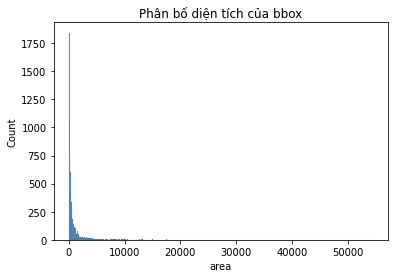

In [28]:
sns.histplot(df['area'])
plt.title('Phân bố diện tích của bbox')
plt.show()

In [29]:
image_area = 1622*626
area_max = df['area'].max()
area_min = df['area'].min()
print('Bbox có diện tích lớn nhất là', area_max, 'chiếm', area_max/image_area*100, '%')
print('Bbox có diện tích nhỏ nhất là', area_min, 'chiếm', area_min/image_area*100, '%')

Bbox có diện tích lớn nhất là 54526 chiếm 5.3700515673073514 %
Bbox có diện tích nhỏ nhất là 4 chiếm 0.0003939442883987346 %


In [30]:
df[df['area'] == df['area'].max()]['image_id']

4916    6300
Name: image_id, dtype: int64

In [31]:
df['area'].mean()/image_area

0.0010484233633315941

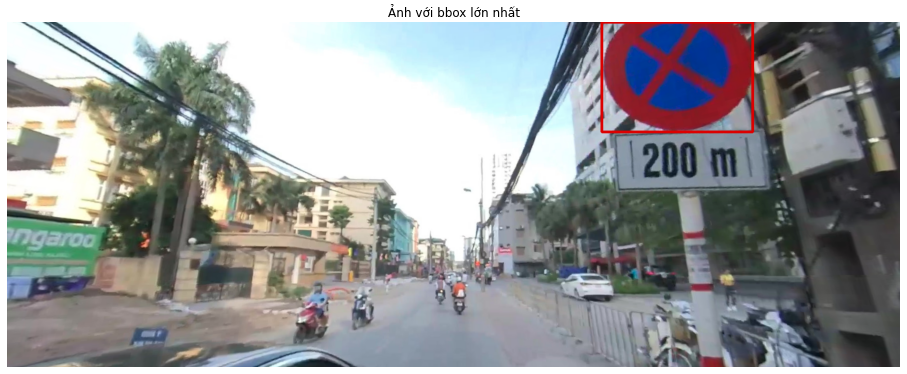

In [32]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
im = cv2.imread('/content/drive/MyDrive/DL_Project/Data/Train_Set/6300.png', cv2.IMREAD_COLOR)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

cv2.rectangle(im,
              (df.iloc[4916]['x'], df.iloc[4916]['y']),
              (df.iloc[4916]['x']+df.iloc[4916]['w'], df.iloc[4916]['y']+df.iloc[4916]['h']),
              (220, 0, 0), 3)
    
ax.set_axis_off()
ax.imshow(im)
plt.title('Ảnh với bbox lớn nhất')
plt.show()

In [33]:
import cv2

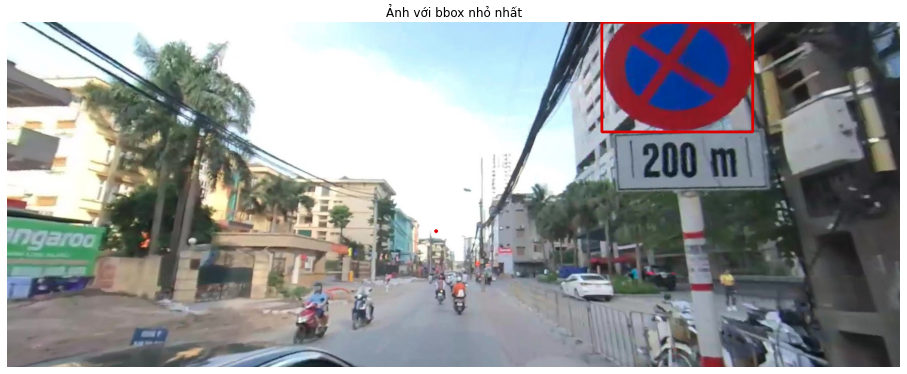

In [34]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

cv2.rectangle(im,
              (df.iloc[8119]['x'], df.iloc[8119]['y']),
              (df.iloc[8119]['x']+df.iloc[8119]['w'], df.iloc[8119]['y']+df.iloc[8119]['h']),
              (220, 0, 0), 3)
    
ax.set_axis_off()
ax.imshow(im)
plt.title('Ảnh với bbox nhỏ nhất')
plt.show()

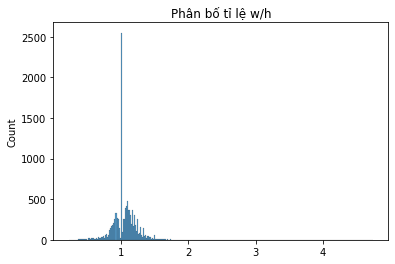

In [35]:
sns.histplot(df['w']/df['h'])
plt.title('Phân bố tỉ lệ w/h')
plt.show()

In [36]:
print('Tỉ lệ lớn nhất', np.max(df['w']/df['h']))

Tỉ lệ lớn nhất 4.741935483870968


In [37]:
print('Tỉ lệ nhỏ nhất',np.min(df['w']/df['h']))

Tỉ lệ nhỏ nhất 0.22857142857142856


In [38]:
np.mean(df['w']/df['h'])

1.0566065417388872

322
1


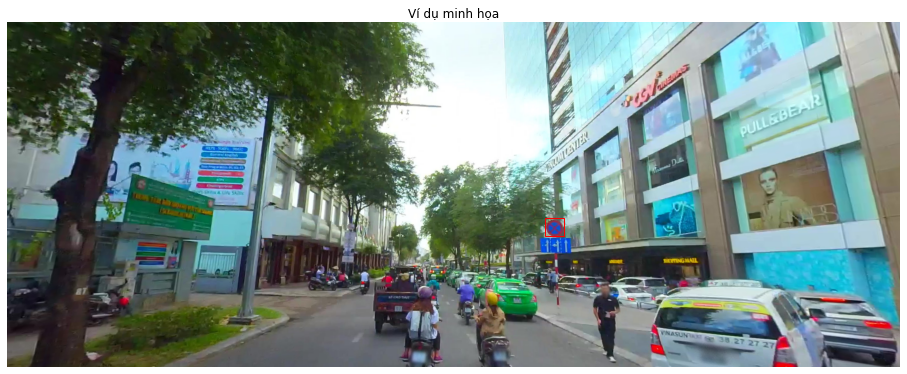

323
1


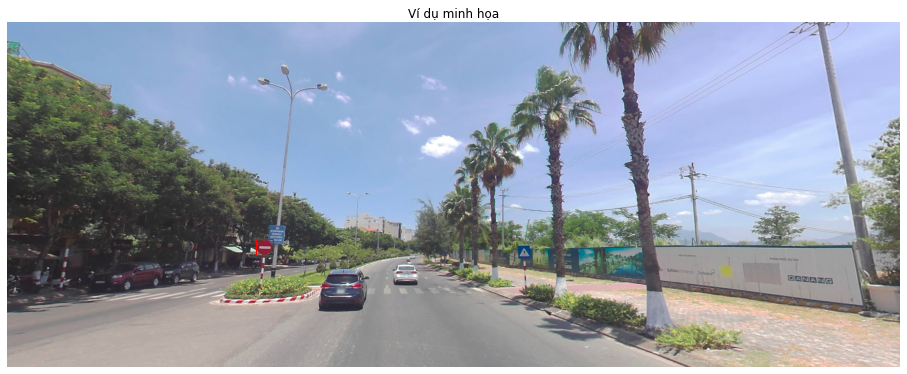

332
2


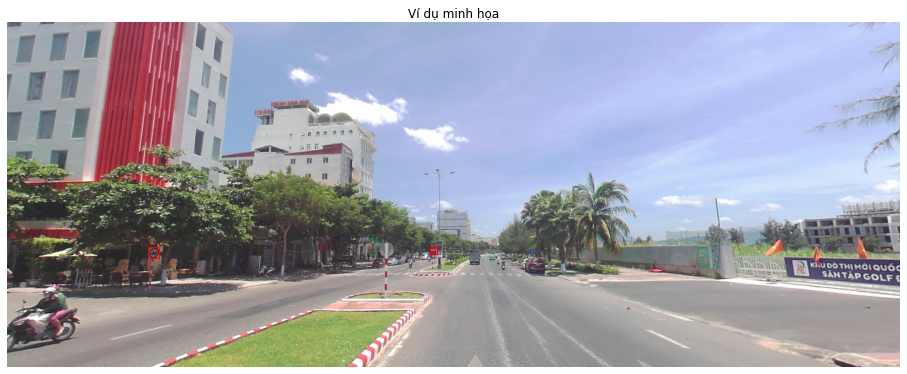

334
2


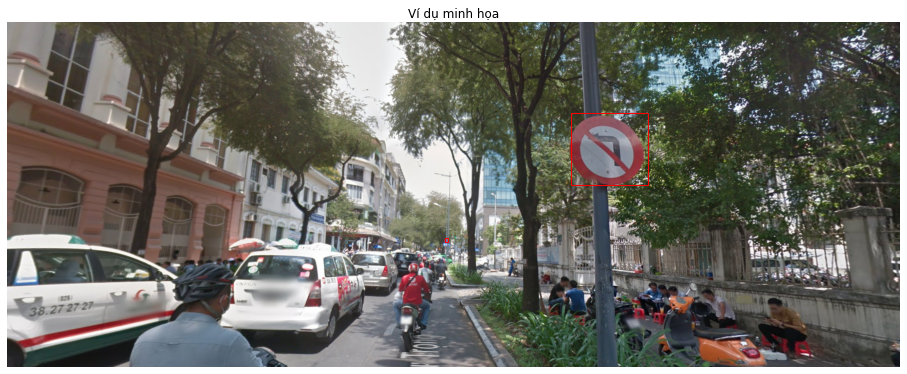

339
4


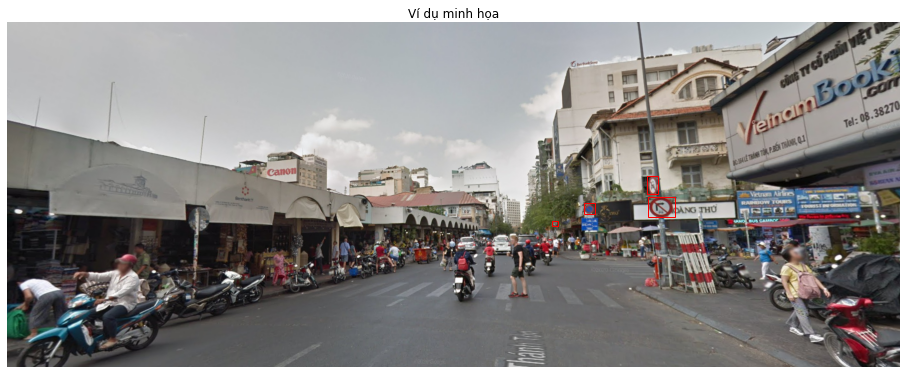

342
1


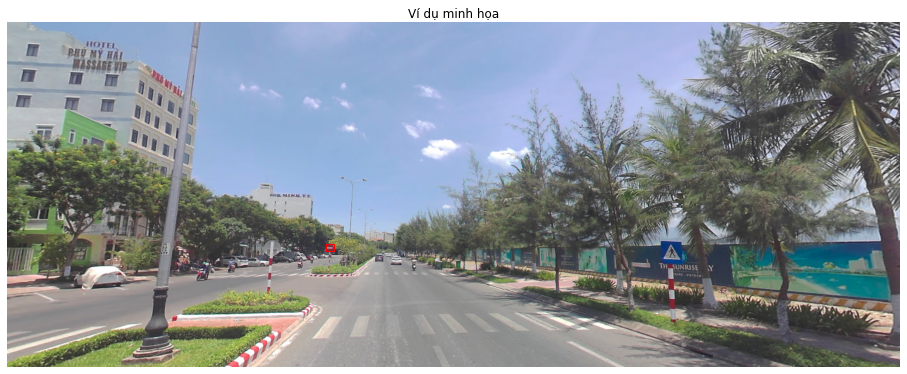

347
2


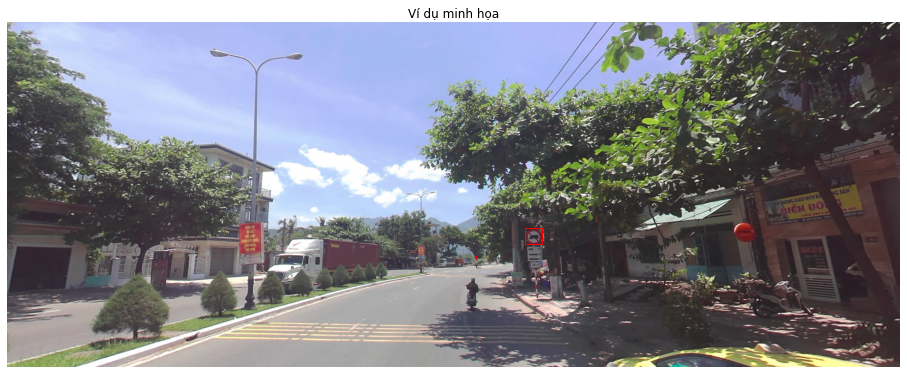

348
2


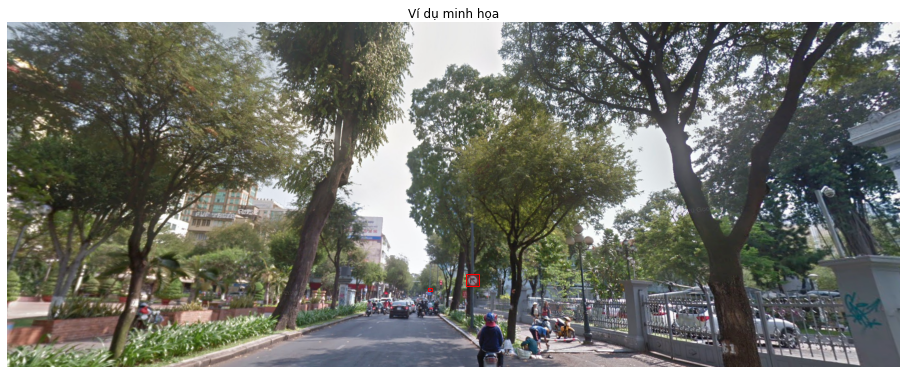

353
1


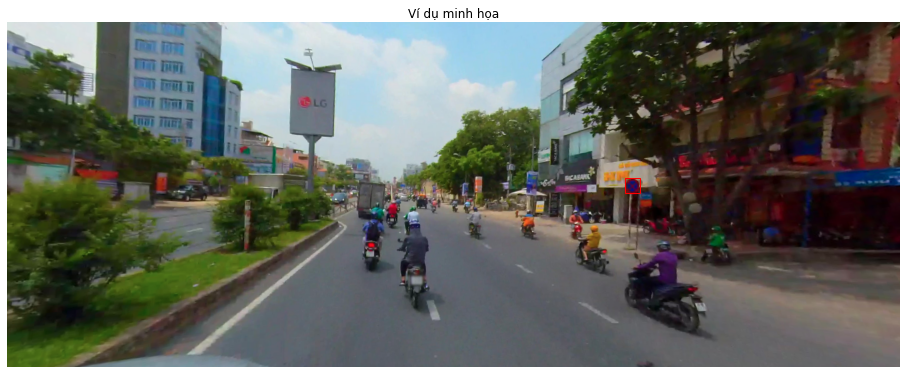

354
2


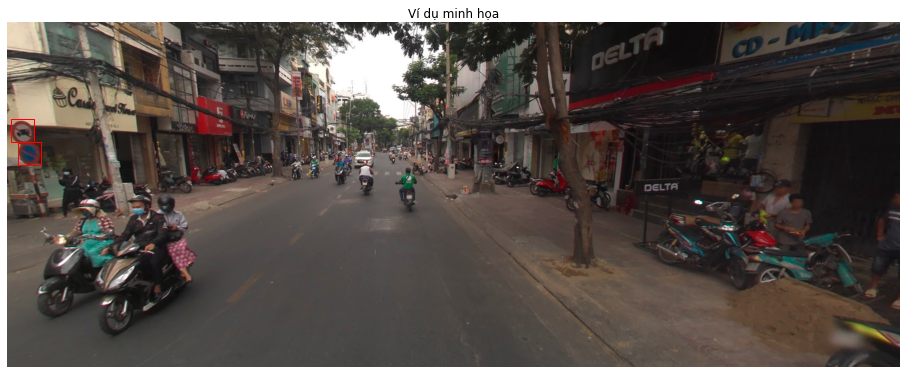

10504
6


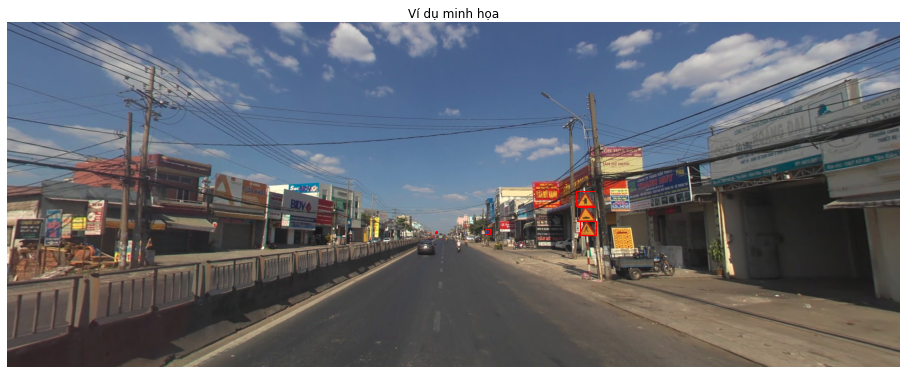

In [39]:
l = np.unique(df['image_id'])[90:100].tolist()
l.append(10504)
for img_id in l:
  print(img_id)
  fig, axs = plt.subplots(1,1, figsize=(16,8))
  img = cv2.imread(os.path.join(train_path, str(img_id) + '.png'))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  axs.imshow(img)
  bboxes = get_all_bboxes(df, img_id)
  print(len(bboxes))
  for bbox in bboxes:
    rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
    axs.add_patch(rect)
  axs.axis('off')
  plt.title('Ví dụ minh họa')
  plt.show()

# 3. EDA với bộ dữ liệu giản lược
- Để tăng độ chính xác, khả thi và ứng dụng của mô hình, nhóm loại bỏ những bbox với diện tích nhỏ hơn 40
- Bên cạnh đó, có những biển báo được annotate với nhiều ground truth, có thể gây ra nhiễu trong quá trình huấn luyện, nên nhóm loại bỏ nhữnnhững ground truth có iou >= 0.7 

In [40]:
train_reduce = pd.read_csv('/content/drive/MyDrive/DL_Project/Data/train_40.csv')
validate_reduce = pd.read_csv('/content/drive/MyDrive/DL_Project/Data/validate_40.csv')
test_reduce = pd.read_csv('/content/drive/MyDrive/DL_Project/Data/test_40.csv')

In [41]:
train_reduce.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,area
0,3.png,1622,626,cam_dung_va_do,880,333,899,351,342
1,5.png,1622,626,cam_re,1069,355,1152,438,6889
2,5.png,1622,626,cam_dung_va_do,768,480,777,487,63
3,6.png,1622,626,nguy_hiem,781,337,798,352,255
4,16.png,1622,626,cam_dung_va_do,733,352,740,360,56


In [42]:
def get_all_bboxes(df, filename):
  image_bboxes = df[df['filename'] == filename]
  bboxes = []
  for _,row in image_bboxes.iterrows():
    bboxes.append((row.xmin, row.ymin, row.xmax - row.xmin, row.ymax - row.ymin))
        
  return bboxes

def draw_img(df, id, t, img_path):
  fig, ax = plt.subplots(1, 1, figsize=(16, 8))
  im = cv2.imread(os.path.join(img_path, df['filename'][id]), cv2.IMREAD_COLOR)
  im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  rect = patches.Rectangle((df.iloc[id]['xmin'], df.iloc[id]['ymin']),df.iloc[id]['xmax']-df.iloc[id]['xmin'],df.iloc[id]['ymax']-df.iloc[id]['ymin'],linewidth=1,edgecolor='r',facecolor='none')
  ax.add_patch(rect)
  ax.set_axis_off()
  ax.imshow(im)
  plt.title(f'Ảnh với {t}')
  plt.show()  


def box_dis_im(df, img_path):
  df_count = df.groupby('filename').size().reset_index(name='count')
  sns.histplot(df_count['count'])
  plt.title('Phân bố số lượng bbox trong ảnh')
  plt.show()

  print('Hầu hết các ảnh có từ 1-2 bbox')
  print('Có {} ảnh có 10 bbox trở lên'.format(len(df_count[df_count['count'] >= 10])))
  num_img_one_bbox = len(df_count[df_count['count'] == 1])
  print(f'Có {num_img_one_bbox} có 1 bbox')
  maxId = df_count['count'].idxmax()
  print('Ảnh với số lượng nhiều bbox nhất là ảnh với ID', df_count['filename'][maxId], 'với', df_count['count'][maxId], 'bbox')
  
  df_max_box = df[df['filename'] == df_count['filename'][maxId]]
  fig, axs = plt.subplots(1,1, figsize=(16,8))
  img_id = np.unique(df_max_box['filename'])[0]
  img = cv2.imread(os.path.join(img_path, img_id))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  axs.imshow(img)
            
  bboxes = get_all_bboxes(df_max_box, img_id)
  for bbox in bboxes:
    rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
    axs.add_patch(rect)
  axs.axis('off')
  plt.title('Ảnh với nhiều bbox nhất')
  plt.show()
  

def box_dis_class(df):
  print(df['class'].unique())
  sns.histplot(df['class'])
  plt.title('Phân bố số lượng bbox trong nhãn')
  plt.xticks(rotation=45)
  plt.show()

  df_cat = df.groupby('class').size().reset_index(name='count')
  maxId = df_cat['count'].idxmax()
  minId = df_cat['count'].idxmin()
  print(f'Lớp {df_cat["class"][maxId]} có nhiều bbox nhất là {df_cat["count"][maxId]}')
  print(f'Lớp {df_cat["class"][minId]} có nhiều bbox nhất là {df_cat["count"][minId]}')
  print(f'Trung bình mỗi lớp có {df_cat["count"].mean()} bbox')


def box_dis_area(df, img_path):
  sns.histplot(df['area'])
  plt.title('Phân bố của diện tích bbox')
  plt.show()

  image_area = 1622*626
  area_max = df['area'].max()
  area_min = df['area'].min()
  area_ave = df['area'].mean()
  print('Bbox có diện tích lớn nhất là', area_max, 'chiếm', area_max/image_area*100, '%')
  print('Bbox có diện tích nhỏ nhất là', area_min, 'chiếm', area_min/image_area*100, '%')
  print('Diện tích TB là', area_ave, 'chiếm', area_ave/image_area*100, '%')

  maxId = df['area'].idxmax()
  minId = df['area'].idxmin()
  draw_img(df, maxId, 'bbox lớn nhất', img_path)
  draw_img(df, minId, 'bbox nhỏ nhất', img_path)

def box_dis_wh(df, img_path):
  sns.histplot((df['xmax']-df['xmin'])/(df['ymax']-df['ymin']))
  plt.xlabel('w/h')
  plt.title('Phân bố tỉ lệ w/h')
  plt.show()

  maxRatio = np.max((df['xmax']-df['xmin'])/(df['ymax']-df['ymin']))
  minRatio = np.min((df['xmax']-df['xmin'])/(df['ymax']-df['ymin']))
  df_copy = df
  df_copy['w/h'] = (df['xmax']-df['xmin'])/(df['ymax']-df['ymin'])
  maxId = df_copy['w/h'].idxmax()
  minId = df_copy['w/h'].idxmin()

  print('Tỉ lệ lớn nhất', maxRatio)
  print('Tỉ lệ nhỏ nhất',minRatio)
  print('Tỉ lệ TB', np.mean((df['xmax']-df['xmin'])/(df['ymax']-df['ymin'])))

  draw_img(df, maxId, 'tỉ lệ w/h lớn nhất', img_path)
  draw_img(df, minId, 'tỉ lệ w/h nhỏ nhất', img_path)
  


def EDA(df, t, img_path):
  print(f'************* EDA CHO {t} ******************')
  print('---------------SỐ LIỆU TỔNG QUÁT----------------')
  print('Kích thước ảnh là 1622x626')
  # Number of images
  num_img = len(df['filename'].unique())
  print('Số lượng ảnh trong tập dữ liệu là', num_img)
  
  # Number of boxes
  num_box = len(df)
  print('Số lượng bbox trong tập dữ liệu là', num_box)

  print('Số lượng bbox trung bình mỗi ảnh là', num_box/num_img)

  # Distribution of boxes in image
  print('----------------PHÂN BỐ BBOX TRONG ẢNH------------')
  box_dis_im(df, img_path)
  
  # Distribution of boxes for class
  print('--------------PHÂN BỐ BBOX TRONG CLASS-------------')
  box_dis_class(df)
  
  #Distribution of bbox area
  print('--------------PHÂN BỐ DIỆN TÍCH BBOX-----------------')
  box_dis_area(df, img_path)

  #Distribution of w/h ratio
  print('--------------PHÂN BỐ TỈ LỆ W/H-----------------')
  box_dis_wh(df, img_path)
  


************* EDA CHO TẬP TRAIN ******************
---------------SỐ LIỆU TỔNG QUÁT----------------
Kích thước ảnh là 1622x626
Số lượng ảnh trong tập dữ liệu là 3861
Số lượng bbox trong tập dữ liệu là 7464
Số lượng bbox trung bình mỗi ảnh là 1.933177933177933
----------------PHÂN BỐ BBOX TRONG ẢNH------------


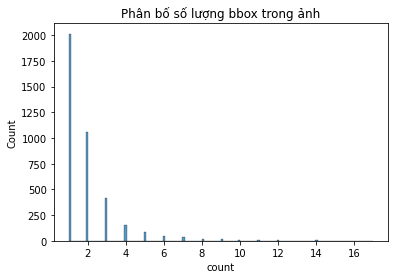

Hầu hết các ảnh có từ 1-2 bbox
Có 26 ảnh có 10 bbox trở lên
Có 2015 có 1 bbox
Ảnh với số lượng nhiều bbox nhất là ảnh với ID 4093.png với 17 bbox


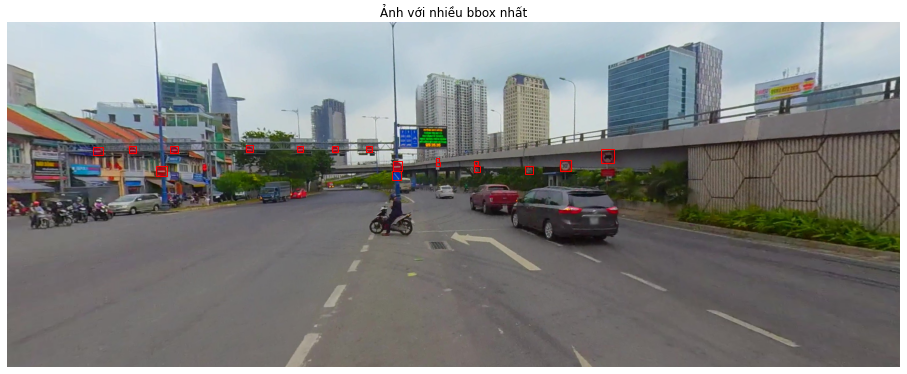

--------------PHÂN BỐ BBOX TRONG CLASS-------------
['cam_dung_va_do' 'cam_re' 'nguy_hiem' 'cam_con_lai' 'gioi_han_toc_do'
 'cam_nguoc_chieu' 'hieu_lenh']


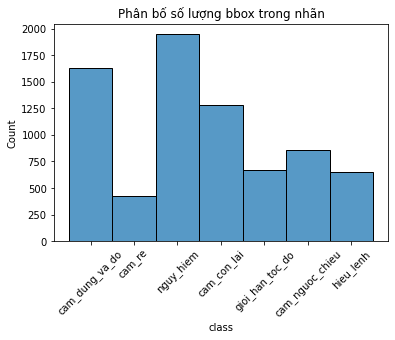

Lớp nguy_hiem có nhiều bbox nhất là 1950
Lớp cam_re có nhiều bbox nhất là 429
Trung bình mỗi lớp có 1066.2857142857142 bbox
--------------PHÂN BỐ DIỆN TÍCH BBOX-----------------


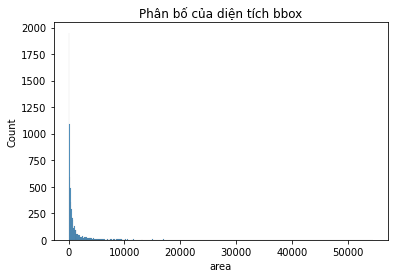

Bbox có diện tích lớn nhất là 54526 chiếm 5.3700515673073514 %
Bbox có diện tích nhỏ nhất là 40 chiếm 0.0039394428839873465 %
Diện tích TB là 1181.3758038585208 chiếm 0.11634906259563203 %


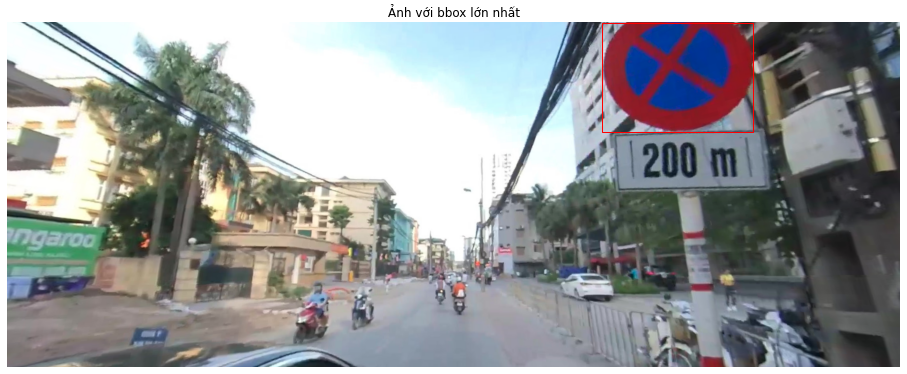

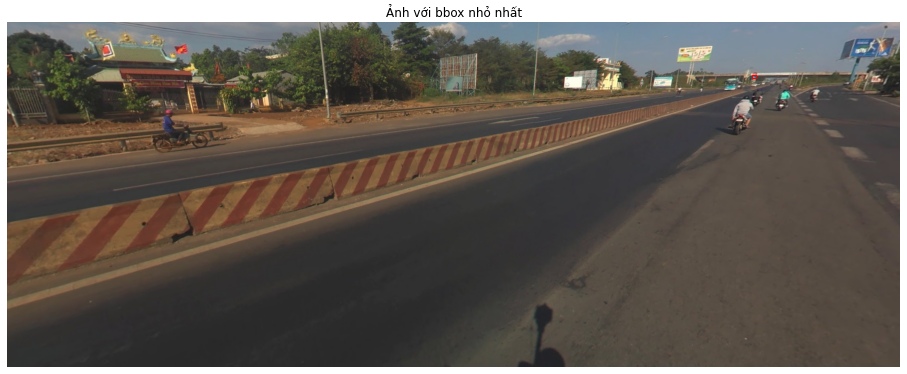

--------------PHÂN BỐ TỈ LỆ W/H-----------------


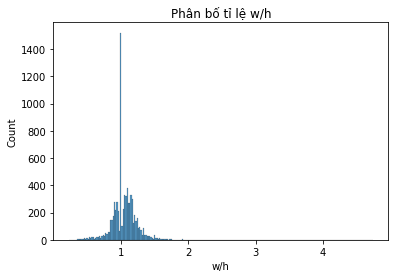

Tỉ lệ lớn nhất 4.741935483870968
Tỉ lệ nhỏ nhất 0.22857142857142856
Tỉ lệ TB 1.0529927723159953


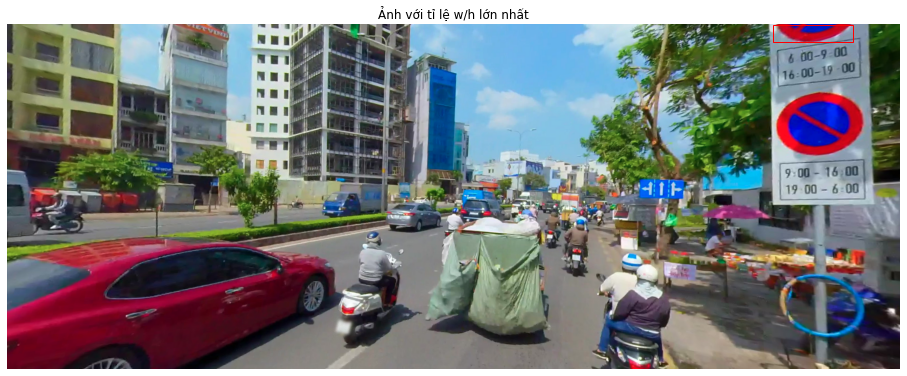

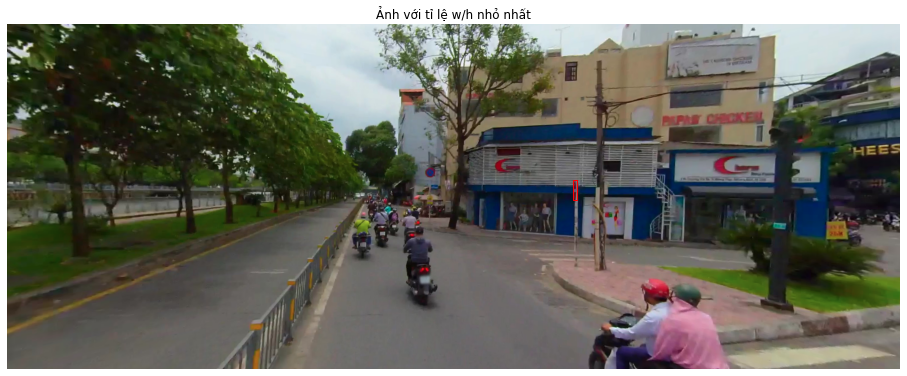

In [43]:
EDA(train_reduce, 'TẬP TRAIN', '/content/drive/MyDrive/DL_Project/Data/Train_Set')

************* EDA CHO TẬP VALIDATION ******************
---------------SỐ LIỆU TỔNG QUÁT----------------
Kích thước ảnh là 1622x626
Số lượng ảnh trong tập dữ liệu là 485
Số lượng bbox trong tập dữ liệu là 948
Số lượng bbox trung bình mỗi ảnh là 1.954639175257732
----------------PHÂN BỐ BBOX TRONG ẢNH------------


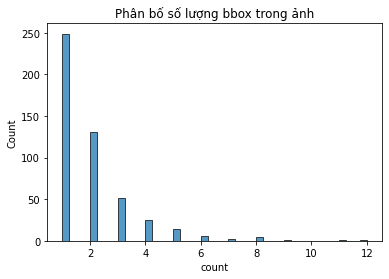

Hầu hết các ảnh có từ 1-2 bbox
Có 2 ảnh có 10 bbox trở lên
Có 249 có 1 bbox
Ảnh với số lượng nhiều bbox nhất là ảnh với ID 4082.png với 12 bbox


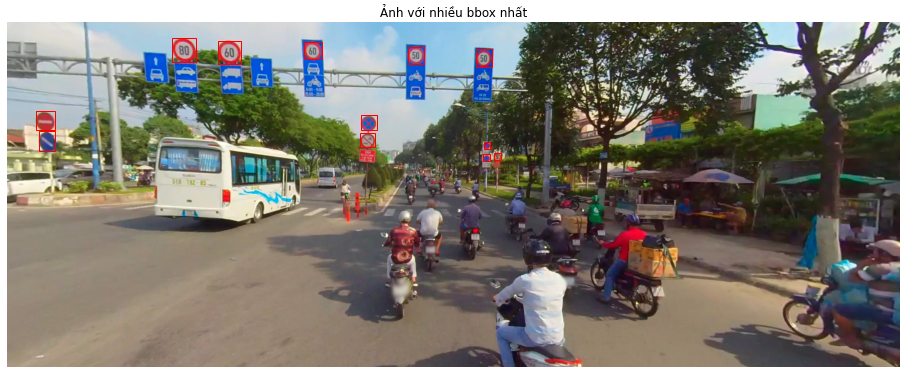

--------------PHÂN BỐ BBOX TRONG CLASS-------------
['cam_re' 'cam_dung_va_do' 'cam_con_lai' 'cam_nguoc_chieu' 'nguy_hiem'
 'gioi_han_toc_do' 'hieu_lenh']


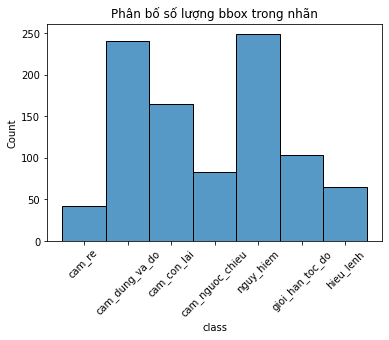

Lớp nguy_hiem có nhiều bbox nhất là 249
Lớp cam_re có nhiều bbox nhất là 42
Trung bình mỗi lớp có 135.42857142857142 bbox
--------------PHÂN BỐ DIỆN TÍCH BBOX-----------------


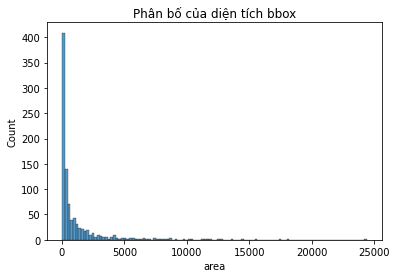

Bbox có diện tích lớn nhất là 24400 chiếm 2.4030601592322816 %
Bbox có diện tích nhỏ nhất là 42 chiếm 0.0041364150281867134 %
Diện tích TB là 1216.2257383966244 chiếm 0.11978129576122096 %


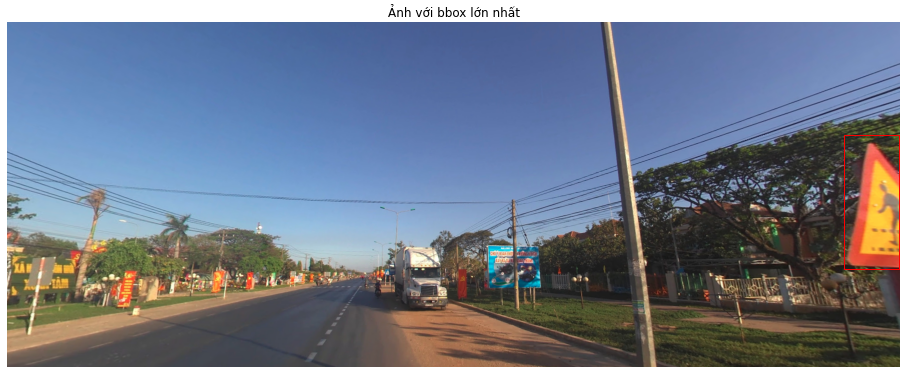

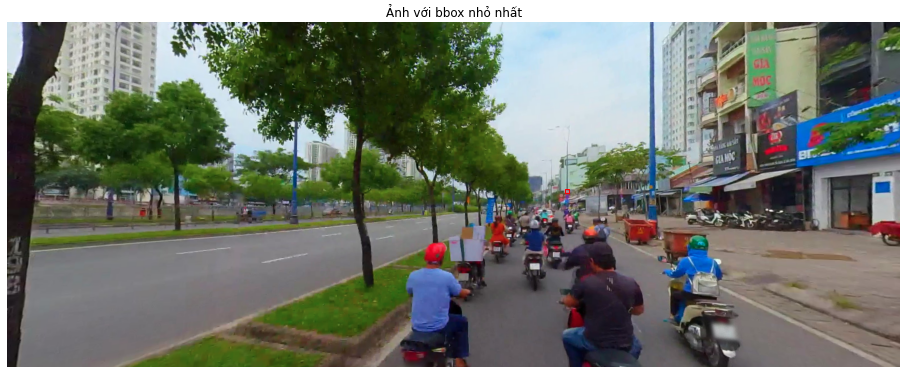

--------------PHÂN BỐ TỈ LỆ W/H-----------------


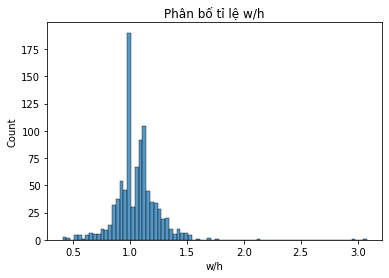

Tỉ lệ lớn nhất 3.081081081081081
Tỉ lệ nhỏ nhất 0.40816326530612246
Tỉ lệ TB 1.0626396973097771


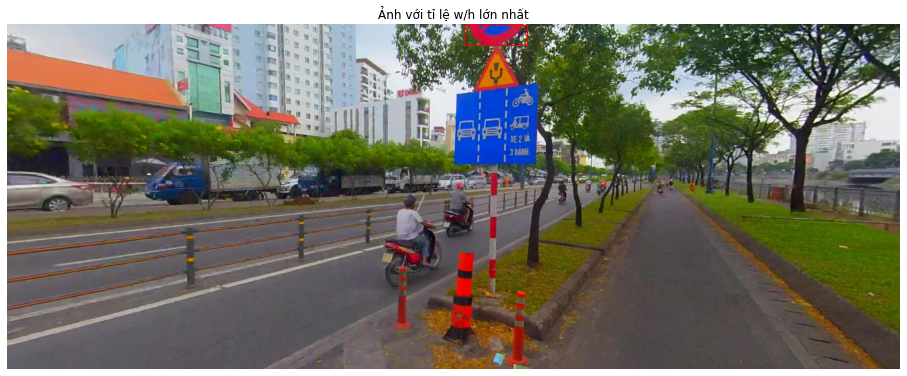

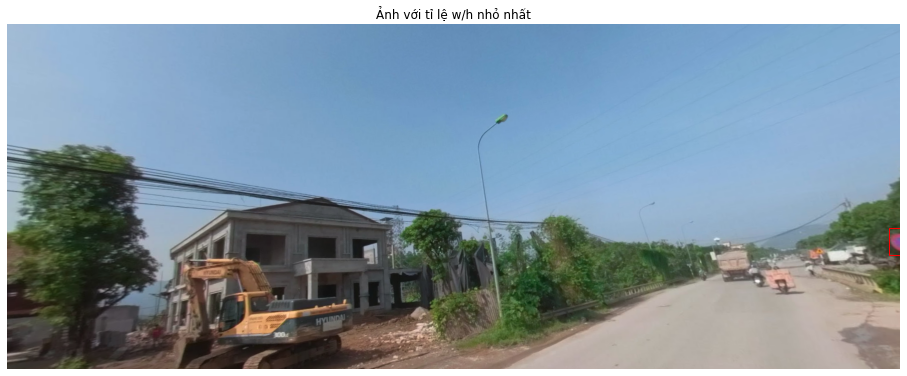

In [44]:
EDA(validate_reduce, 'TẬP VALIDATION', '/content/drive/MyDrive/DL_Project/Data/Train_Set')

# 4. EDA cho bộ public test

************* EDA CHO TẬP PUBLIC TEST ******************
---------------SỐ LIỆU TỔNG QUÁT----------------
Kích thước ảnh là 1622x626
Số lượng ảnh trong tập dữ liệu là 579
Số lượng bbox trong tập dữ liệu là 1159
Số lượng bbox trung bình mỗi ảnh là 2.001727115716753
----------------PHÂN BỐ BBOX TRONG ẢNH------------


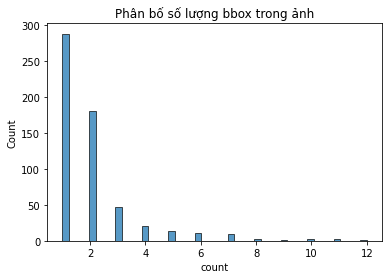

Hầu hết các ảnh có từ 1-2 bbox
Có 6 ảnh có 10 bbox trở lên
Có 288 có 1 bbox
Ảnh với số lượng nhiều bbox nhất là ảnh với ID 11177.png với 12 bbox


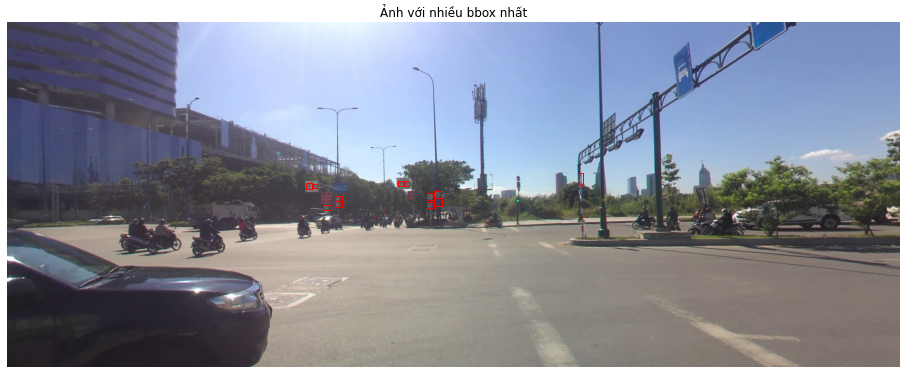

--------------PHÂN BỐ BBOX TRONG CLASS-------------
['cam_re' 'hieu_lenh' 'nguy_hiem' 'cam_nguoc_chieu' 'cam_dung_va_do'
 'gioi_han_toc_do' 'cam_con_lai']


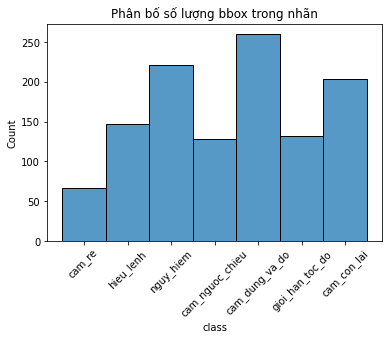

Lớp cam_dung_va_do có nhiều bbox nhất là 260
Lớp cam_re có nhiều bbox nhất là 67
Trung bình mỗi lớp có 165.57142857142858 bbox
--------------PHÂN BỐ DIỆN TÍCH BBOX-----------------


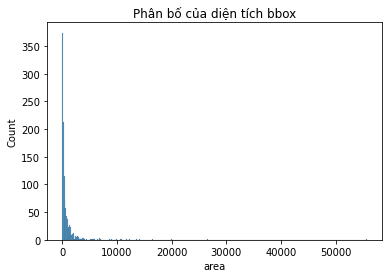

Bbox có diện tích lớn nhất là 55687 chiếm 5.484393897015084 %
Bbox có diện tích nhỏ nhất là 42 chiếm 0.0041364150281867134 %
Diện tích TB là 922.1164797238999 chiếm 0.0908156301063945 %


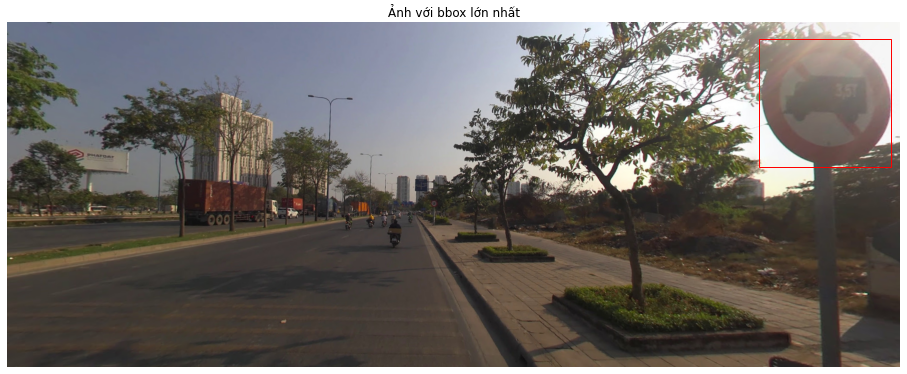

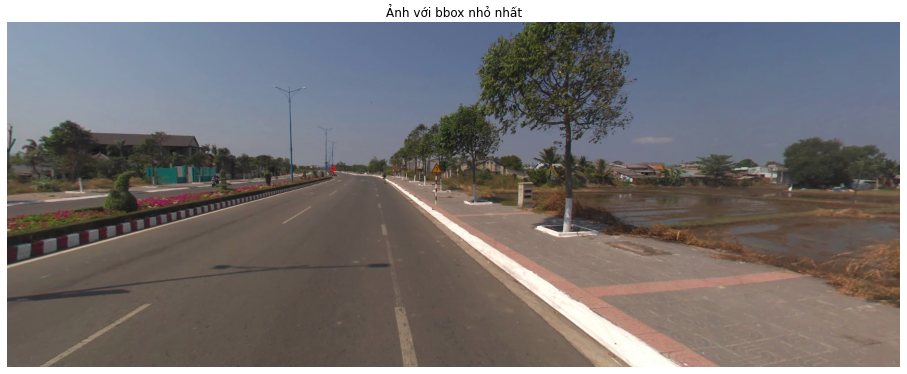

--------------PHÂN BỐ TỈ LỆ W/H-----------------


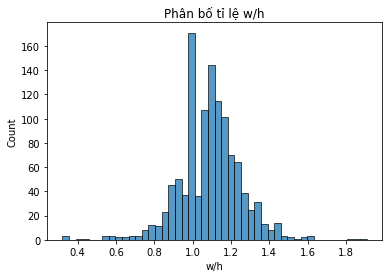

Tỉ lệ lớn nhất 1.9090909090909092
Tỉ lệ nhỏ nhất 0.32
Tỉ lệ TB 1.091067123788483


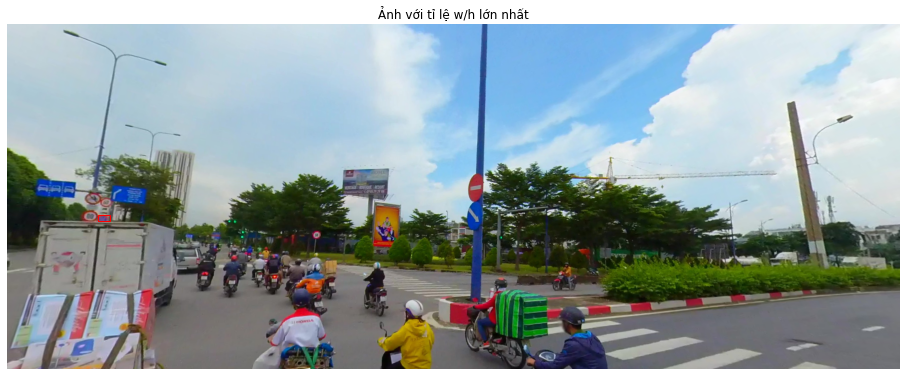

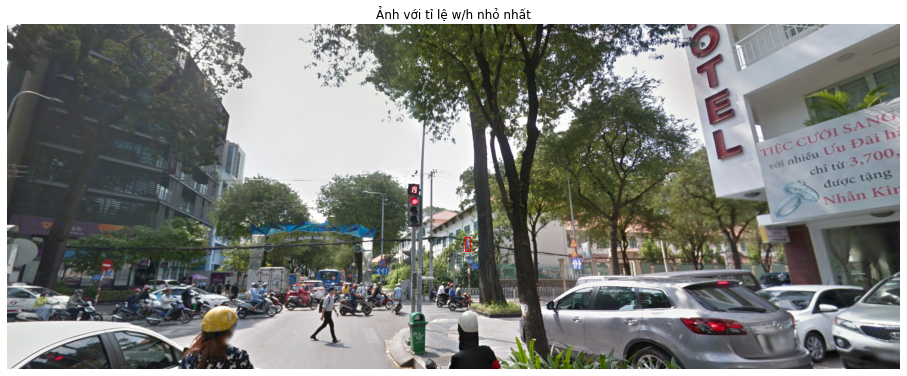

In [45]:
EDA(test_reduce, 'TẬP PUBLIC TEST', '/content/drive/MyDrive/DL_Project/Data/Test_Set_Public')